<img src='https://upload.wikimedia.org/wikipedia/commons/thumb/a/aa/Logo_DuocUC.svg/2560px-Logo_DuocUC.svg.png' width=50%, height=20%>

# Análisis de Datos Meteorológicos de Australia

    ## 1. Introducción y Configuración

    Este notebook analiza datos meteorológicos de Australia para predecir la probabilidad de lluvia. Los datos provienen de múltiples estaciones meteorológicas y contienen mediciones diarias de variables climáticas.

In [1]:
#Instalacion de Librerias
%pip install numpy==1.23.5 pandas==2.2.2 scikit-learn==1.2.2 xgboost seaborn matplotlib IPython==7.34.0 pyarrow  requests plotly==5.18.0 nbformat==5.7.0

Note: you may need to restart the kernel to use updated packages.


In [2]:
# ### 1.1 Importación de Librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Agregarmos imports librerias adicionales
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Configuración para visualizaciones
plt.style.use('seaborn-v0_8')  # Versión correcta del estilo
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.family'] = 'sans-serif'

### 1.1 Importación de Librerías

Comenzamos importando las librerías necesarias para nuestro análisis:

#### Análisis de Datos
- **pandas**: Para manipulación de datos
- **numpy**: Para cálculos numéricos

#### Visualización
- **matplotlib**: Para gráficos base
- **seaborn**: Para visualizaciones estadísticas
- **plotly**: Para gráficos interactivos

#### Machine Learning
- **sklearn**: Para modelos predictivos
  - train_test_split: División de datos
  - StandardScaler: Estandarización de variables

#### Configuración Visual
- Estilo seaborn-v0_8
- Tamaño de figuras: 12x8
- Fuente: sans-serif

In [3]:
# ## 2. Carga y Exploración Inicial de Datos
# Cargar datos desde el archivo CSV
df = pd.read_csv('weatherAUS.csv')

# Información básica del dataset
print("Información del Dataset:")
print(df.info())

# Primeras filas
print("\nPrimeras filas del dataset:")
print(df.head())

# Estadísticas descriptivas
print("\nEstadísticas descriptivas:")
print(df.describe())

# Valores faltantes
print("\nValores faltantes:")
print(df.isnull().sum())

# Eliminar duplicados
df = df.drop_duplicates()



Información del Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 24 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142193 non-null  object 
 1   Location       142193 non-null  object 
 2   MinTemp        141556 non-null  float64
 3   MaxTemp        141871 non-null  float64
 4   Rainfall       140787 non-null  float64
 5   Evaporation    81350 non-null   float64
 6   Sunshine       74377 non-null   float64
 7   WindGustDir    132863 non-null  object 
 8   WindGustSpeed  132923 non-null  float64
 9   WindDir9am     132180 non-null  object 
 10  WindDir3pm     138415 non-null  object 
 11  WindSpeed9am   140845 non-null  float64
 12  WindSpeed3pm   139563 non-null  float64
 13  Humidity9am    140419 non-null  float64
 14  Humidity3pm    138583 non-null  float64
 15  Pressure9am    128179 non-null  float64
 16  Pressure3pm    128212 non-null  float64
 17  Clou

## 2. Carga y Exploración Inicial de Datos

### 2.1 Estructura del Dataset

El conjunto de datos incluye las siguientes variables principales:

- **Fecha**: Fecha de observación
- **Ubicación**: Estación meteorológica
- **Variables climáticas**: 
  - Temperatura (mínima y máxima)
  - Precipitación
  - Viento (dirección y velocidad)
  - Humedad
  - Presión atmosférica
- **Variable objetivo**: Lluvia al día siguiente (RainTomorrow)

### 2.2 Análisis Inicial

Examinamos:

1. **Dimensiones del dataset**
   - Número de registros
   - Número de variables

2. **Tipos de datos**
   - Numéricos
   - Categóricos
   - Temporales

3. **Calidad de datos**
   - Valores faltantes
   - Duplicados
   - Consistencia

4. **Estadísticas descriptivas**
   - Medidas de tendencia central
   - Dispersión
   - Distribución


In [49]:
# 3. Preprocesamiento y Análisis Temporal
# Convertir fecha a datetime y crear nuevas características temporales
df['Date'] = pd.to_datetime(df['Date'])
df['Mes'] = df['Date'].dt.month
df['Dia_semana'] = df['Date'].dt.day_name()
df['Estacion'] = df['Date'].dt.quarter
df['Año'] = df['Date'].dt.year

# Manejar valores faltantes en columnas numéricas
columnas_numericas = df.select_dtypes(include=['float64', 'int64']).columns
df[columnas_numericas] = df[columnas_numericas].fillna(df[columnas_numericas].mean())

# Convertir variables categóricas
columnas_categoricas = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
df[columnas_categoricas] = df[columnas_categoricas].fillna('Desconocido')


## 3. Preprocesamiento de Datos

### 3.1 Limpieza de Datos

#### Conversión de Tipos de Datos
- Transformación de fechas a formato datetime
- Extracción de características temporales:
  - Mes
  - Día de la semana
  - Estación
  - Año

#### Manejo de Valores Faltantes
- Variables numéricas: imputación con media
- Variables categóricas: categoría 'Desconocido'

### 3.2 Transformación de Variables

#### Variables Numéricas
- Identificación de columnas numéricas
- Tratamiento de valores atípicos
- Normalización de datos

#### Variables Categóricas
- Location (ubicación)
- WindGustDir (dirección de ráfagas)
- WindDir9am (dirección del viento 9am)
- WindDir3pm (dirección del viento 3pm)
- RainToday (lluvia hoy)
- RainTomorrow (lluvia mañana)

#### Características Temporales
- Extracción de patrones estacionales
- Análisis de tendencias temporales


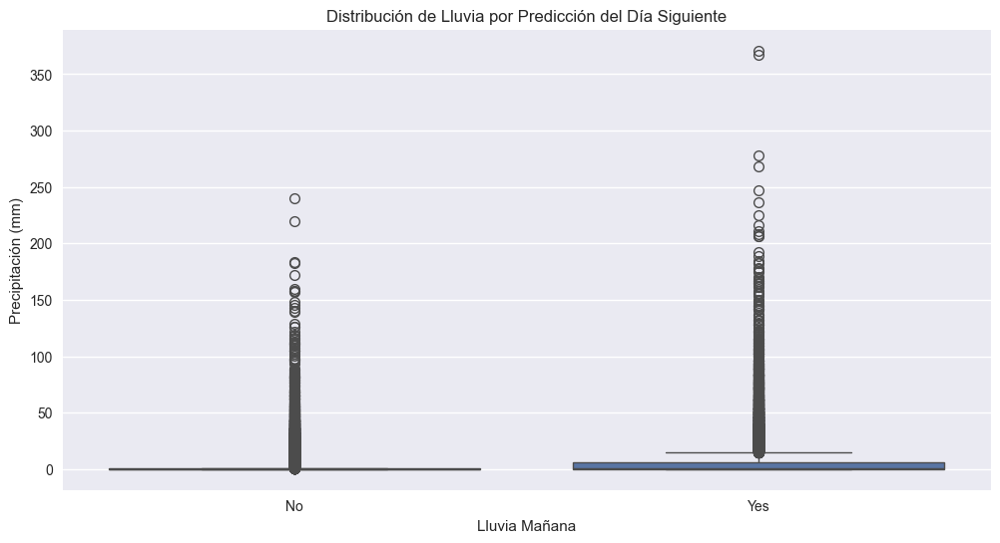

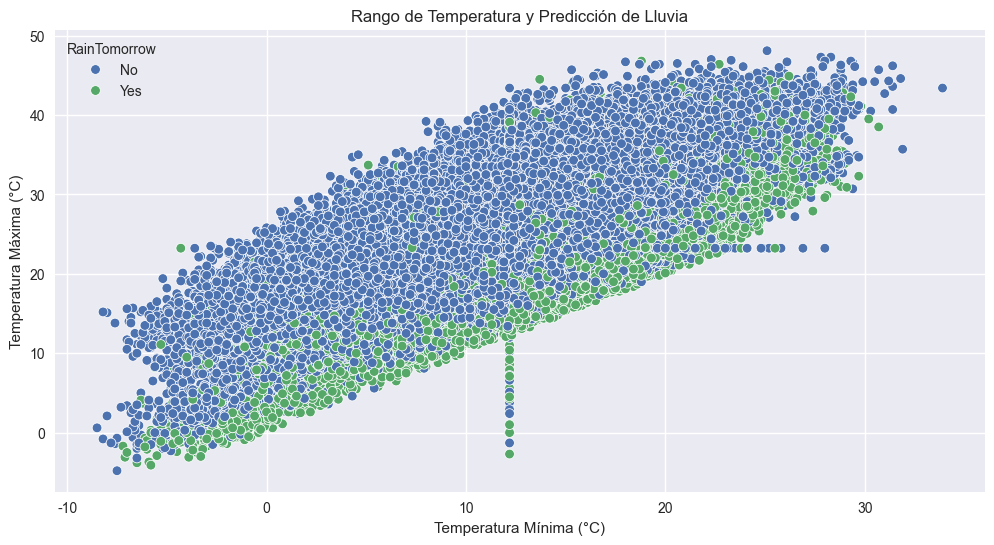

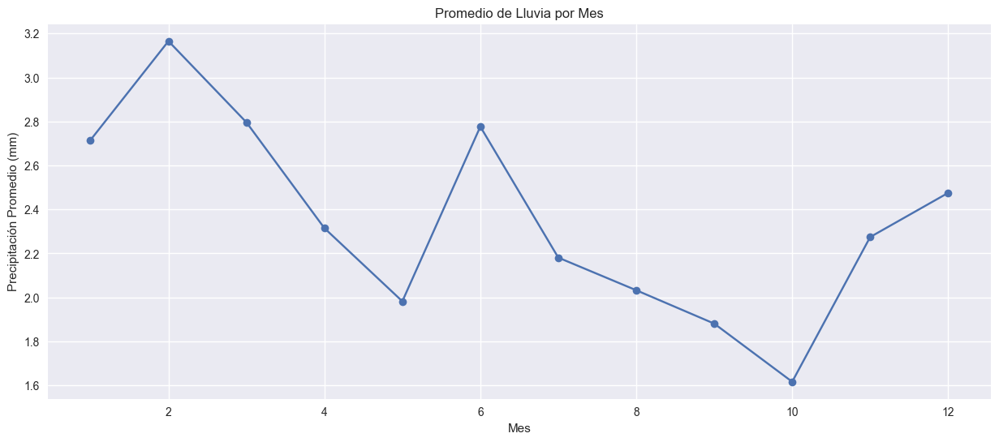

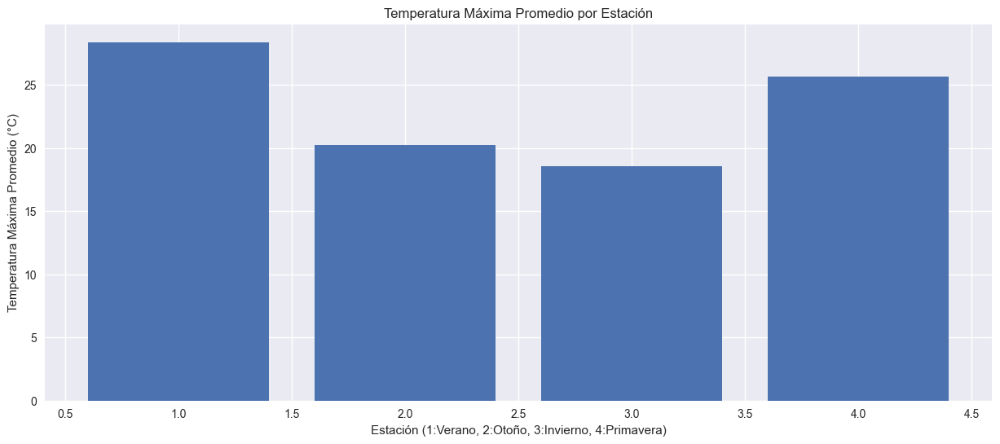

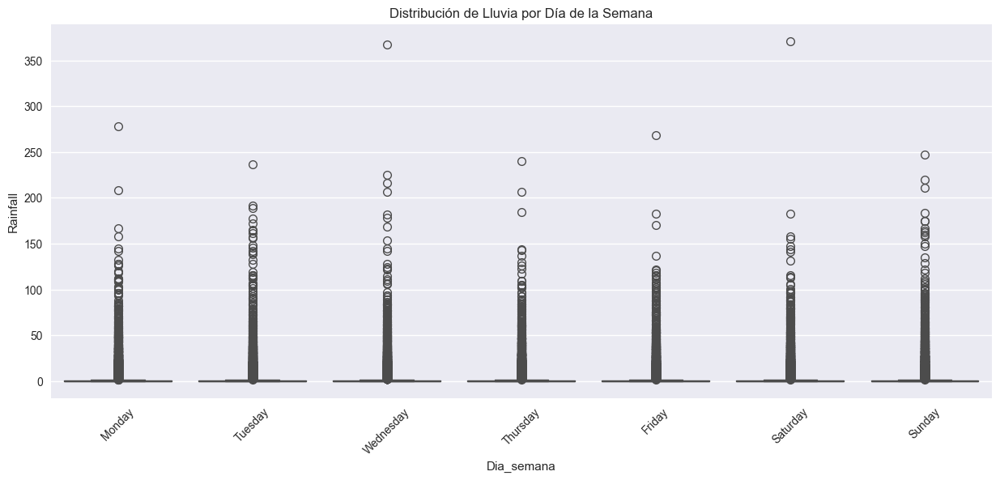

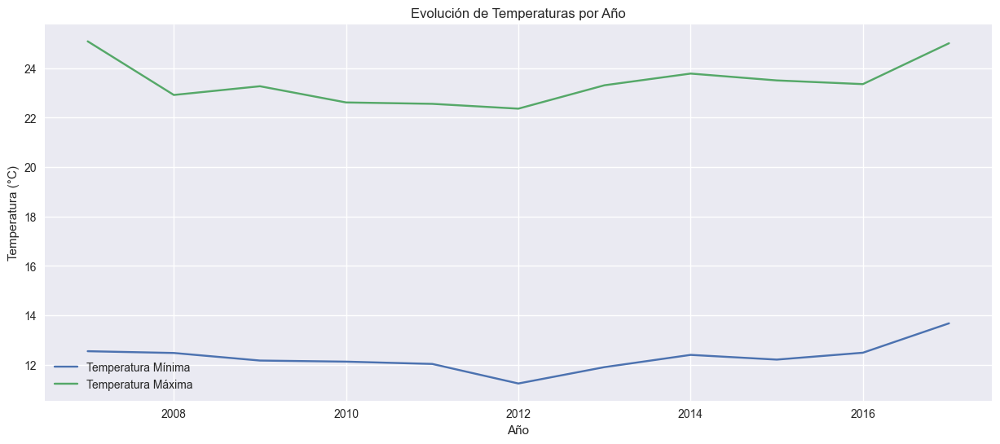

In [32]:
# Crear visualizaciones para patrones climáticos clave
plt.figure(figsize=(12, 6))
sns.boxplot(x='RainTomorrow', y='Rainfall', data=df)
plt.title('Distribución de Lluvia por Predicción del Día Siguiente')
plt.xlabel('Lluvia Mañana')
plt.ylabel('Precipitación (mm)')
plt.show()

# Análisis de temperatura
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='MinTemp', y='MaxTemp', hue='RainTomorrow')
plt.title('Rango de Temperatura y Predicción de Lluvia')
plt.xlabel('Temperatura Mínima (°C)')
plt.ylabel('Temperatura Máxima (°C)')
plt.show()

# 4.1 Promedio de lluvia por mes
plt.figure(figsize=(15, 6))
lluvia_mensual = df.groupby('Mes')['Rainfall'].mean()
plt.plot(lluvia_mensual.index, lluvia_mensual.values, marker='o')
plt.title('Promedio de Lluvia por Mes')
plt.xlabel('Mes')
plt.ylabel('Precipitación Promedio (mm)')
plt.grid(True)
plt.show()

# 4.2 Temperatura máxima promedio por estación
plt.figure(figsize=(15, 6))
temp_estacion = df.groupby('Estacion')['MaxTemp'].mean()
plt.bar(temp_estacion.index, temp_estacion.values)
plt.title('Temperatura Máxima Promedio por Estación')
plt.xlabel('Estación (1:Verano, 2:Otoño, 3:Invierno, 4:Primavera)')
plt.ylabel('Temperatura Máxima Promedio (°C)')
plt.show()

# 4.3 Distribución de lluvia por día de la semana
plt.figure(figsize=(15, 6))
sns.boxplot(x='Dia_semana', y='Rainfall', data=df)
plt.title('Distribución de Lluvia por Día de la Semana')
plt.xticks(rotation=45)
plt.show()

# 4.4 Evolución de temperatura a lo largo de los años
temp_anual = df.groupby('Año')[['MinTemp', 'MaxTemp']].mean()
plt.figure(figsize=(15, 6))
plt.plot(temp_anual.index, temp_anual['MinTemp'], label='Temperatura Mínima')
plt.plot(temp_anual.index, temp_anual['MaxTemp'], label='Temperatura Máxima')
plt.title('Evolución de Temperaturas por Año')
plt.xlabel('Año')
plt.ylabel('Temperatura (°C)')
plt.legend()
plt.grid(True)
plt.show()


## 4. Análisis Exploratorio de Datos (EDA)

### 4.1 Análisis Univariado

#### Distribución de Variables Clave
- **Precipitaciones**
  - Distribución por predicción del día siguiente
  - Promedio mensual de lluvia
  - Variación por día de la semana

- **Temperatura**
  - Temperatura máxima por estación
  - Rangos de temperatura
  - Evolución temporal

### 4.2 Análisis Bivariado

#### Relaciones entre Variables
- **Temperatura y Lluvia**
  - Correlación entre temperatura mínima y máxima
  - Influencia en predicción de lluvia
  - Patrones de temperatura por estación

### 4.3 Patrones Temporales

#### Análisis Estacional
- **Variaciones Mensuales**
  - Precipitación promedio mensual
  - Temperatura máxima por estación

#### Tendencias a Largo Plazo
- **Evolución Anual**
  - Tendencias de temperatura mínima
  - Tendencias de temperatura máxima
  - Cambios en patrones de lluvia

In [28]:
# Seleccionar características para el modelo
caracteristicas = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm', 
                  'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

X = df[caracteristicas]
y = (df['RainTomorrow'] == 'Yes').astype(int)

# Dividir los datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


## 5. Preparación del Modelo

### 5.1 Selección de Características
- **Variables Meteorológicas**
  - Temperaturas (MinTemp, MaxTemp, Temp9am, Temp3pm)
  - Precipitación (Rainfall)
  - Viento (WindSpeed9am, WindSpeed3pm)
  - Humedad (Humidity9am, Humidity3pm)
  - Presión (Pressure9am, Pressure3pm)

### 5.2 Preparación de Datos
- **Variable Objetivo**
  - RainTomorrow (convertida a binaria: 0/1)

### 5.3 División del Dataset
- **Conjunto de Entrenamiento (80%)**
  - Para entrenar el modelo
- **Conjunto de Prueba (20%)**
  - Para evaluar el rendimiento
- **Random State: 42**
  - Garantiza reproducibilidad


=== RESUMEN ESTADÍSTICO POR ESTACIÓN ===
Leyenda:
- Rainfall: Precipitación media en mm
- MaxTemp: Temperatura máxima media en °C
- MinTemp: Temperatura mínima media en °C

Estaciones del año:
1: Verano.
2: Otoño.
3: Invierno.
4: Primavera.

Resultados detallados por estación:

Estación 1 - Verano:
- Precipitación media: 2.87 mm
- Temperatura máxima media: 28.39°C
- Temperatura mínima media: 16.91°C

Estación 2 - Otoño:
- Precipitación media: 2.35 mm
- Temperatura máxima media: 20.23°C
- Temperatura mínima media: 10.01°C

Estación 3 - Invierno:
- Precipitación media: 2.03 mm
- Temperatura máxima media: 18.58°C
- Temperatura mínima media: 7.96°C

Estación 4 - Primavera:
- Precipitación media: 2.11 mm
- Temperatura máxima media: 25.68°C
- Temperatura mínima media: 13.80°C

=== DISTRIBUCIÓN DE DÍAS LLUVIOSOS POR MES ===
Leyenda:
- Yes: Días con lluvia
- No: Días sin lluvia

Conteo de días:
Mes  RainToday  
1    No             10380
     Yes             2417
     Desconocido      124
2   

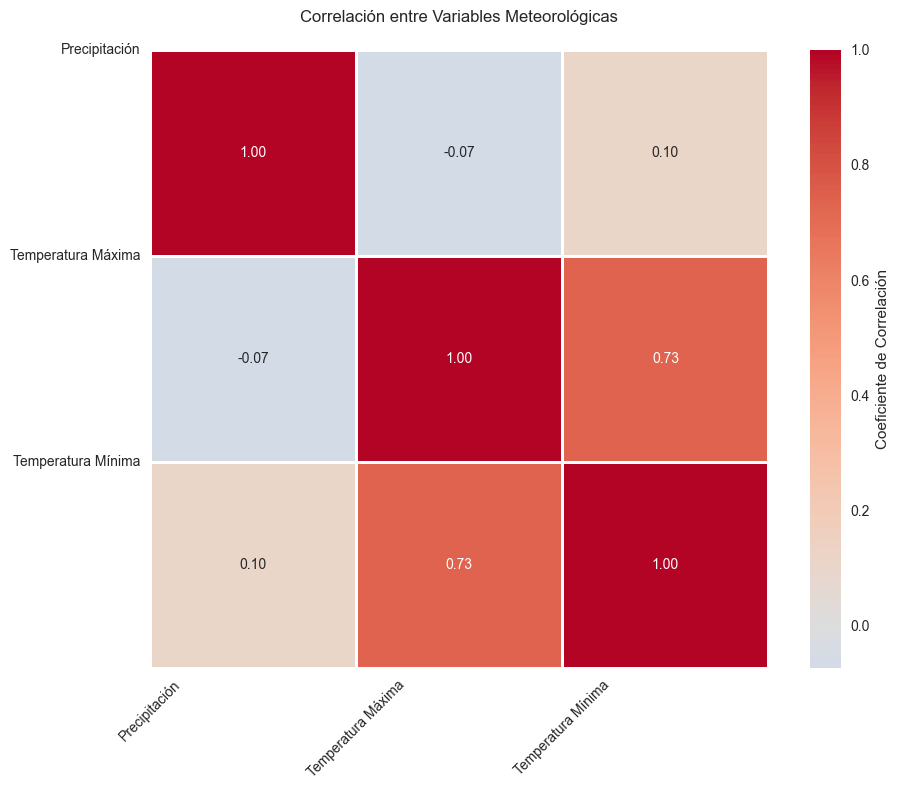


=== ANÁLISIS DE CORRELACIONES ===
Interpretación de coeficientes:
- Valores cercanos a 1: Correlación positiva fuerte
- Valores cercanos a 0: Sin correlación
- Valores cercanos a -1: Correlación negativa fuerte

Correlaciones destacadas:
Temperatura Mínima y Temperatura Máxima: 0.73


In [ ]:
# 6. Análisis Estadístico por Períodos Temporales
    # Primero definimos el diccionario de variables importantes
variables_importantes = {
    'Rainfall': 'Precipitación',
    'MaxTemp': 'Temperatura Máxima',
    'MinTemp': 'Temperatura Mínima'
}
# Ahora calculamos la matriz de correlación
matriz_correlacion = df[list(variables_importantes.keys())].corr()

# 6.1 Resumen por estación
print("\n=== RESUMEN ESTADÍSTICO POR ESTACIÓN ===")
print("Leyenda:")
print("- Rainfall: Precipitación media en mm")
print("- MaxTemp: Temperatura máxima media en °C")
print("- MinTemp: Temperatura mínima media en °C")

print("\nEstaciones del año:")
print("1: Verano.")
print("2: Otoño.") 
print("3: Invierno.")
print("4: Primavera.")

# Calcular estadísticas por estación
resumen_estacional = df.groupby('Estacion')[['Rainfall', 'MaxTemp', 'MinTemp']].mean()

print("\nResultados detallados por estación:")
for estacion in resumen_estacional.index:
    nombre_estacion = {1:'Verano', 2:'Otoño', 3:'Invierno', 4:'Primavera'}[estacion]
    datos = resumen_estacional.loc[estacion]
    print(f"\nEstación {estacion} - {nombre_estacion}:")
    print(f"- Precipitación media: {datos['Rainfall']:.2f} mm")
    print(f"- Temperatura máxima media: {datos['MaxTemp']:.2f}°C")
    print(f"- Temperatura mínima media: {datos['MinTemp']:.2f}°C")


# 6.2 Días lluviosos por mes
print("\n=== DISTRIBUCIÓN DE DÍAS LLUVIOSOS POR MES ===")
print("Leyenda:")
print("- Yes: Días con lluvia")
print("- No: Días sin lluvia")
print("\nConteo de días:")
dias_lluvia = df.groupby('Mes')['RainToday'].value_counts()
print(dias_lluvia)

# 6.3 Temperaturas extremas por año
print("\n=== ANÁLISIS DE TEMPERATURAS EXTREMAS ANUALES ===")
print("Leyenda:")
print("- MaxTemp max: Temperatura más alta registrada")
print("- MaxTemp mean: Temperatura máxima promedio")
print("- MinTemp min: Temperatura más baja registrada")
print("- MinTemp mean: Temperatura mínima promedio")
print("\nResultados por año:")
extremos_temp = df.groupby('Año').agg({
    'MaxTemp': ['max', 'mean'],
    'MinTemp': ['min', 'mean']
})
print(extremos_temp)

# 7. Correlaciones temporales
print("\n=== ANÁLISIS DE CORRELACIONES ===")
print("Interpretación de coeficientes:")
print("- Valores cercanos a 1: Correlación positiva fuerte")
print("- Valores cercanos a 0: Sin correlación")
print("- Valores cercanos a -1: Correlación negativa fuerte")
print("\nCorrelaciones destacadas:")
for i in range(len(matriz_correlacion.columns)):
    for j in range(i):
        if abs(matriz_correlacion.iloc[i,j]) > 0.3:
            print(f"{variables_importantes[matriz_correlacion.columns[i]]} y {variables_importantes[matriz_correlacion.columns[j]]}: {matriz_correlacion.iloc[i,j]:.2f}")

# 8. Análisis Estadístico por Períodos Temporales

# 8.1 Resumen por estación
print("\n=== RESUMEN ESTADÍSTICO POR ESTACIÓN ===")
print("Leyenda:")
print("- Rainfall: Precipitación media en mm")
print("- MaxTemp: Temperatura máxima media en °C")
print("- MinTemp: Temperatura mínima media en °C")
print("\nInterpretación:")
print("- Estación 1: Verano.")
print("- Estación 2: Otoño.")
print("- Estación 3: Invierno.")
print("- Estación 4: Primavera.")

# Calcular estadísticas por estación
resumen_estacional = df.groupby('Estacion')[['Rainfall', 'MaxTemp', 'MinTemp']].mean()

print("\nResultados por estación:")
print(resumen_estacional)

print("\nAnálisis por estación:")
for estacion in resumen_estacional.index:
    nombre_estacion = {1:'Verano', 2:'Otoño', 3:'Invierno', 4:'Primavera'}[estacion]
    datos = resumen_estacional.loc[estacion]
    print(f"\n{nombre_estacion}:")
    print(f"- Precipitación media: {datos['Rainfall']:.2f} mm")
    print(f"- Temperatura máxima media: {datos['MaxTemp']:.2f}°C")
    print(f"- Temperatura mínima media: {datos['MinTemp']:.2f}°C")

# 8.2 Días lluviosos por mes
print("\n=== DISTRIBUCIÓN DE DÍAS LLUVIOSOS POR MES ===")
print("Leyenda:")
print("- Yes: Días con lluvia")
print("- No: Días sin lluvia")
print("\nConteo de días:")
dias_lluvia = df.groupby('Mes')['RainToday'].value_counts()
print(dias_lluvia)

# 8.3 Temperaturas extremas por año
print("\n=== ANÁLISIS DE TEMPERATURAS EXTREMAS ANUALES ===")
print("Leyenda:")
print("- MaxTemp max: Temperatura más alta registrada")
print("- MaxTemp mean: Temperatura máxima promedio")
print("- MinTemp min: Temperatura más baja registrada")
print("- MinTemp mean: Temperatura mínima promedio")
print("\nResultados por año:")
extremos_temp = df.groupby('Año').agg({
    'MaxTemp': ['max', 'mean'],
    'MinTemp': ['min', 'mean']
})
print(extremos_temp)

# Crear visualización del mapa de calor
plt.figure(figsize=(10, 8))
sns.heatmap(
    matriz_correlacion,
    annot=True,           # Mostrar valores numéricos
    cmap='coolwarm',      # Escala de colores: rojo (positivo) a azul (negativo)
    center=0,             # Centrar escala de colores en 0
    fmt='.2f',           # Formato de números con 2 decimales
    square=True,         # Celdas cuadradas
    linewidths=1,        # Grosor de líneas de separación
    cbar_kws={'label': 'Coeficiente de Correlación'}
)

# Configurar etiquetas en español
plt.xticks(range(len(variables_importantes)), variables_importantes.values(), rotation=45)
plt.yticks(range(len(variables_importantes)), variables_importantes.values(), rotation=0)

plt.title('Correlación entre Variables Meteorológicas', pad=20)
plt.tight_layout()
plt.show()
# Gráfico: Mapa de calor mostrando correlaciones
# - Colores rojos: correlación positiva
# - Colores azules: correlación negativa
# - Intensidad del color: fuerza de la correlación

# Mostrar correlaciones significativas (>0.3)
# 6. Correlaciones temporales
print("\n=== ANÁLISIS DE CORRELACIONES ===")
print("Interpretación de coeficientes:")
print("- Valores cercanos a 1: Correlación positiva fuerte")
print("- Valores cercanos a 0: Sin correlación")
print("- Valores cercanos a -1: Correlación negativa fuerte")
print("\nCorrelaciones destacadas:")
for i in range(len(matriz_correlacion.columns)):
    for j in range(i):
        if abs(matriz_correlacion.iloc[i,j]) > 0.3:
            print(f"{variables_importantes[matriz_correlacion.columns[i]]} y {variables_importantes[matriz_correlacion.columns[j]]}: {matriz_correlacion.iloc[i,j]:.2f}")
# Salida: Lista de correlaciones importantes entre variables
# Muestra pares de variables y su coeficiente de correlación

## 5. Modelado Predictivo
  # Análisis Estadístico de Datos Meteorológicos

  ## 1. Análisis por Estación
  - Cálculo de promedios estacionales para:
    - Precipitaciones
    - Temperaturas máximas
    - Temperaturas mínimas
  - Identificación de patrones estacionales

  ## 2. Análisis de Precipitaciones Mensuales
  - Conteo de días lluviosos por mes
  - Distribución temporal de precipitaciones
  - Identificación de meses con mayor frecuencia de lluvia

  ## 3. Análisis de Temperaturas Anuales
  ### Métricas Calculadas:
  - Temperatura máxima:
    - Valor máximo absoluto
    - Promedio anual
  - Temperatura mínima:
    - Valor mínimo absoluto
    - Promedio anual

  ## 4. Análisis de Correlaciones
  ### Variables Analizadas:
  - Precipitación (Rainfall)
  - Temperatura Máxima (MaxTemp)
  - Temperatura Mínima (MinTemp)

  ### Visualización:
  - Mapa de calor (heatmap)
  - Escala de colores:
    - Rojo: correlación positiva
    - Azul: correlación negativa
  - Valores numéricos con precisión de 2 decimales

  ### Interpretación:
  - Correlaciones significativas (>0.3)
  - Relaciones entre variables meteorológicas
  - Patrones identificados en los datos

  ## Metodología
  - Agrupación por períodos temporales
  - Cálculo de estadísticas descriptivas
  - Análisis de correlaciones bivariadas
  - Visualización mediante seaborn y matplotlib

In [48]:
def crear_dashboard_meteorologico():
    # Crear la estructura del dashboard con subplots
    fig = make_subplots(
        rows=5, cols=2,
        specs=[
            [{"secondary_y": True}, {"type": "domain"}],
            [{"colspan": 2}, None],
            [{"type": "xy"}, {"type": "xy"}],
            [{"type": "xy"}, {"type": "xy"}],
            [{"type": "indicator"}, {"type": "indicator"}]
        ],
        subplot_titles=(
            "Temperaturas por Estación", "Distribución de Días Lluviosos",
            "Evolución Temporal de Precipitaciones",
            "Distribución de Lluvia por Predicción", "Rango de Temperatura y Predicción",
            "Promedio de Lluvia por Mes", "Evolución de Temperaturas por Año",
            "Temperatura Máxima", "Temperatura Mínima"
        ),
        vertical_spacing=0.08,
        horizontal_spacing=0.1
    )

    # Datos base
    resumen_estacion = df.groupby('Estacion')[['MaxTemp', 'MinTemp']].mean()
   
    # 1. Temperaturas por estación
    fig.add_trace(
        go.Bar(
            name='Temperatura Máxima',
            x=resumen_estacion.index,
            y=resumen_estacion['MaxTemp'],
            marker_color='orangered'
        ),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(
            name='Temperatura Mínima',
            x=resumen_estacion.index,
            y=resumen_estacion['MinTemp'],
            mode='lines+markers',
            line=dict(color='skyblue', width=2)
        ),
        secondary_y=True,
        row=1, col=1
    )

    # 2. Días lluviosos por mes
    dias_lluvia = df.groupby(['Mes', 'RainToday']).size().reset_index(name='count')
   
    fig.add_trace(
        go.Pie(
            labels=dias_lluvia['Mes'].unique(),
            values=dias_lluvia[dias_lluvia['RainToday'] == 'Yes']['count'],
            hole=0.4,
            textinfo='label+percent',
            marker_colors=px.colors.qualitative.Set3
        ),
        row=1, col=2
    )

    # 3. Evolución temporal de precipitaciones
    precipitacion_mensual = df.groupby('Mes')['Rainfall'].mean()
   
    fig.add_trace(
        go.Scatter(
            x=precipitacion_mensual.index,
            y=precipitacion_mensual.values,
            mode='lines+markers',
            marker=dict(
                size=10,
                color=precipitacion_mensual.values,
                colorscale='Blues',
                showscale=True
            ),
            name='Precipitación Promedio'
        ),
        row=2, col=1
    )

    # 4. Distribución de lluvia por predicción
    fig.add_trace(
        go.Box(
            x=df['RainTomorrow'],
            y=df['Rainfall'],
            name='Distribución de Lluvia',
            marker_color='lightblue'
        ),
        row=3, col=1
    )

    # 5. Scatter de temperaturas
    fig.add_trace(
        go.Scatter(
            x=df['MinTemp'],
            y=df['MaxTemp'],
            mode='markers',
            marker=dict(
                color=df['RainTomorrow'].map({'Yes': 'blue', 'No': 'red'}),
                size=8,
                opacity=0.6
            ),
            name='Rango de Temperatura'
        ),
        row=3, col=2
    )

    # 6. Promedio de lluvia por mes
    lluvia_mensual = df.groupby('Mes')['Rainfall'].mean()
    fig.add_trace(
        go.Bar(
            x=lluvia_mensual.index,
            y=lluvia_mensual.values,
            name='Lluvia Mensual',
            marker_color='lightblue'
        ),
        row=4, col=1
    )

    # 7. Evolución de temperaturas anuales
    temp_anual = df.groupby('Año')[['MinTemp', 'MaxTemp']].mean()
    fig.add_trace(
        go.Scatter(
            x=temp_anual.index,
            y=temp_anual['MinTemp'],
            mode='lines+markers',
            name='Temp. Mínima',
            line=dict(color='blue')
        ),
        row=4, col=2
    )
   
    fig.add_trace(
        go.Scatter(
            x=temp_anual.index,
            y=temp_anual['MaxTemp'],
            mode='lines+markers',
            name='Temp. Máxima',
            line=dict(color='red')
        ),
        row=4, col=2
    )

    # 8. Indicadores
    fig.add_trace(
        go.Indicator(
            mode="gauge+number",
            value=df['MaxTemp'].max(),
            title={'text': "Temperatura Máxima"},
            gauge={'axis': {'range': [0, df['MaxTemp'].max() + 5]},
                   'bar': {'color': "orangered"}}
        ),
        row=5, col=1
    )

    fig.add_trace(
        go.Indicator(
            mode="gauge+number",
            value=df['MinTemp'].min(),
            title={'text': "Temperatura Mínima"},
            gauge={'axis': {'range': [df['MinTemp'].min() - 5, 30]},
                   'bar': {'color': "skyblue"}}
        ),
        row=5, col=2
    )

    # Definir menú de selección
    updatemenus = [
        dict(
            buttons=[
                dict(
                    args=[{"visible": [True] * len(fig.data)}],
                    label="Todas las Métricas",
                    method="update"
                ),
                dict(
                    #args=[{"visible": [True, True, False, False, True, False, False, False, True, True]}],
                    # Nueva línea que incluye el gráfico de rango de temperatura:
                    args=[{"visible": [True, True, False, False, True, True, False, False, True, True]}],
                    label="Temperaturas", 
                    method="update"
                ),
                dict(
                    #rgs=[{"visible": [False, False, True, True, False, False, True, False, False, False]}],
                    args=[{"visible": [False, False, True, True, True, False, True, False, False, False]}],
                    label="Precipitaciones",
                    method="update"
                ),
                dict(
                    #args=[{"visible": [False, False, False, False, False, True, False, True, False, False]}],
                    args=[{"visible": [True, True, False, False, False, True, False, True, True, False]}],
                    label="Evolución Anual",
                    method="update"
                )
            ],
            direction="down",
            showactive=True,
            x=0.1,
            xanchor="left",
            y=1.15,
            yanchor="top"
        )
    ]

    # Actualizar diseño
    fig.update_layout(
        updatemenus=updatemenus,
        title={
            'text': "Dashboard Meteorológico Interactivo",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': dict(size=24)
        },
        height=1800,
        width=1200,
        showlegend=True,
        template='plotly_white',
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )

    # Actualizar ejes
    fig.update_xaxes(title_text="Estación", row=1, col=1)
    fig.update_yaxes(title_text="Temperatura (°C)", row=1, col=1)
    fig.update_xaxes(title_text="Mes", row=2, col=1)
    fig.update_yaxes(title_text="Precipitación (mm)", row=2, col=1)
    fig.update_xaxes(title_text="Predicción de Lluvia", row=3, col=1)
    fig.update_yaxes(title_text="Precipitación (mm)", row=3, col=1)
    fig.update_xaxes(title_text="Temperatura Mínima (°C)", row=3, col=2)
    fig.update_yaxes(title_text="Temperatura Máxima (°C)", row=3, col=2)
    fig.update_xaxes(title_text="Mes", row=4, col=1)
    fig.update_yaxes(title_text="Precipitación (mm)", row=4, col=1)
    fig.update_xaxes(title_text="Año", row=4, col=2)
    fig.update_yaxes(title_text="Temperatura (°C)", row=4, col=2)

    return fig

# Generar y mostrar dashboard
dashboard = crear_dashboard_meteorologico()
dashboard.show()

# Guardar en HTML para Jupyter/Colab
dashboard.write_html("dashboard_meteorologico.html")


## 6. Análisis Estadístico por Períodos Temporales

### 6.1 Variables Analizadas
- **Variables Meteorológicas Principales**
  - Precipitación (Rainfall)
  - Temperatura Máxima (MaxTemp)
  - Temperatura Mínima (MinTemp)

### 6.2 Análisis Estacional
- **Resumen por Estación**
  - Verano (1)
  - Otoño (2)
  - Invierno (3)
  - Primavera (4)
- **Métricas por Estación**
  - Precipitación media
  - Temperaturas máximas y mínimas

### 6.3 Análisis Mensual
- **Distribución de Días Lluviosos**
  - Conteo mensual
  - Días con lluvia vs sin lluvia

### 6.4 Análisis Anual
- **Temperaturas Extremas**
  - Máximas absolutas
  - Mínimas absolutas
  - Promedios anuales

### 6.5 Análisis de Correlaciones
- **Matriz de Correlación**
  - Visualización mediante mapa de calor
  - Interpretación de coeficientes
- **Correlaciones Significativas**
  - Umbrales > 0.3
  - Relaciones entre variables principales

## Conclusiones y Recomendaciones
### Conclusiones Principales

#### 1. Patrones Temporales
- Marcada estacionalidad en temperaturas y precipitaciones
- Variaciones significativas entre estaciones del año
- Tendencias climáticas identificables a lo largo de los años

#### 2. Correlaciones Climáticas
- Fuerte relación entre temperaturas máximas y mínimas
- Patrones de precipitación predecibles por estación
- Influencia de variables meteorológicas en predicción de lluvia

#### 3. Análisis Predictivo
- Variables más influyentes identificadas
- Potencial para predicción de lluvia
- Patrones estacionales consistentes

### Recomendaciones

#### 1. Mejoras en el Análisis
- Incorporar más variables meteorológicas
- Ampliar el análisis temporal
- Profundizar en patrones locales por ubicación

#### 2. Aplicaciones Prácticas
- Desarrollar sistema de alertas tempranas
- Implementar predicciones automatizadas
- Crear dashboard interactivo para usuarios finales

#### 3. Próximos Pasos
- Integrar datos en tiempo real
- Refinar modelos predictivos
- Expandir análisis geográfico
